In [1]:
%matplotlib inline
from __future__ import print_function, unicode_literals
import sys, os
import datetime as dt
import seaborn as sns
import numpy as np
import matplotlib
from matplotlib import pyplot as plt

In [2]:
from pygaarst import raster
import pandas as pd
import geopandas as gp
from fiona.crs import from_string
import shapely.ops
from shapely.geometry import Point
from matplotlib.collections import PatchCollection
from descartes import PolygonPatch

In [30]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset

In [3]:
sys.path.append('../firedetection/')
import landsat8fire as lfire

In [4]:
sns.set(rc={'image.cmap': 'gist_heat'})
sns.set(rc={'image.cmap': 'bone'})

sns.set_context("poster")

myfontsize = 20
font = {'family' : 'Calibri',
        'weight': 'bold',
        'size'   : myfontsize}
matplotlib.rc('font', **font)
matplotlib.axes.rcParams['axes.labelsize']=myfontsize-4
matplotlib.axes.rcParams['axes.titlesize']=myfontsize
cmap1 =  matplotlib.colors.ListedColormap(sns.xkcd_palette(['white', 'red']))
cmap2 =  matplotlib.colors.ListedColormap(sns.xkcd_palette(['white', 'neon green']))
cmap3 =  matplotlib.colors.ListedColormap(sns.xkcd_palette(['white', 'orange']))

In [5]:
gisdir = "/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/GISout/"
newviirspolydf = gp.GeoDataFrame.from_file(os.path.join(gisdir, 'sockeyeviirsspoly.shp'))

In [6]:
landsatpath = '/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/Landsat/L8 OLI_TIRS Sockeye'
lsscene = 'LC80700172015166LGN00'
landsat = raster.Landsatscene(os.path.join(landsatpath, lsscene))

In [7]:
productdir = '/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/rasterout/'

In [8]:
landsat.infix = '_clip'

In [16]:
rho7 = landsat.band7.reflectance
rho6 = landsat.band6.reflectance
rho5 = landsat.band5.reflectance
rho1 = landsat.band1.reflectance

In [9]:
xmax = landsat.band7.ncol
ymax = landsat.band7.nrow

In [10]:
allfire, highfire, anomfire, lowfire = lfire.get_l8fire(landsat)

In [11]:
allfire_masked = np.ma.masked_where(
        ~allfire, np.ones((ymax, xmax)))
highfire_masked = np.ma.masked_where(
        ~highfire, np.ones((ymax, xmax)))

In [12]:
sum(sum(lowfire))

95

In [13]:
sum(sum(allfire))

390

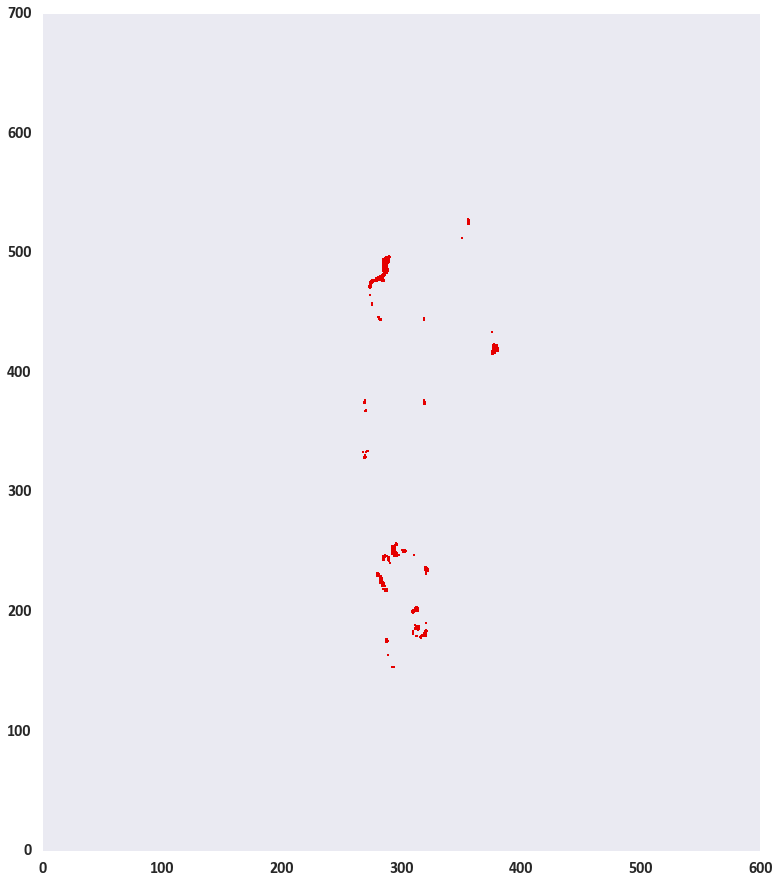

In [14]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')

ax1.pcolormesh(np.flipud(allfire_masked), cmap=cmap1, vmin=0, vmax=1)

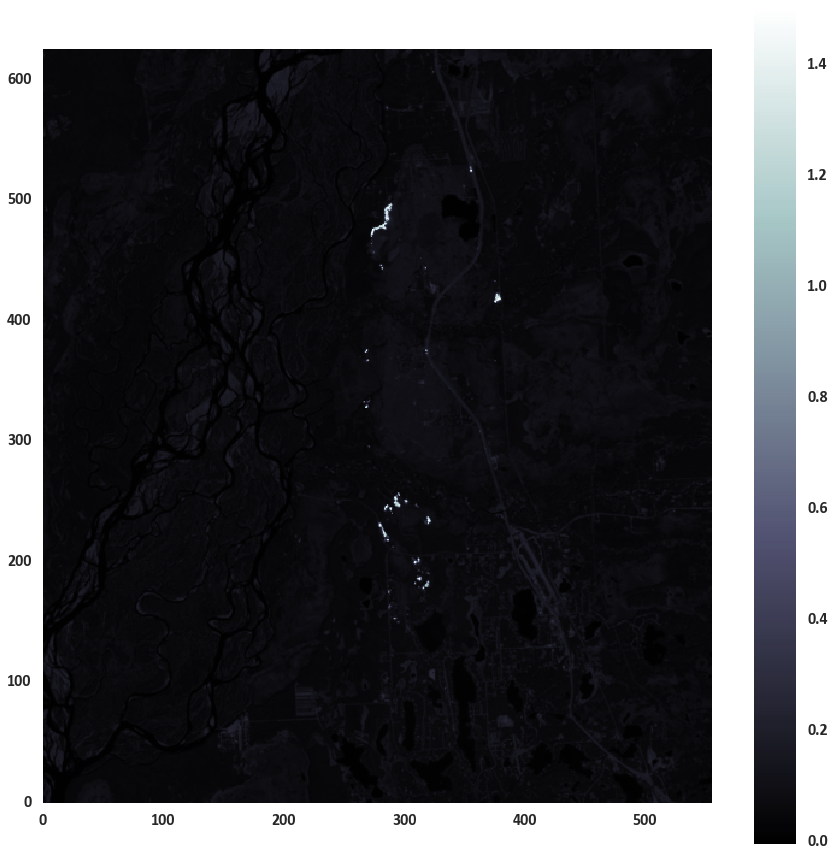

In [17]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(rho7))
cbar = fig1.colorbar(dataplot)

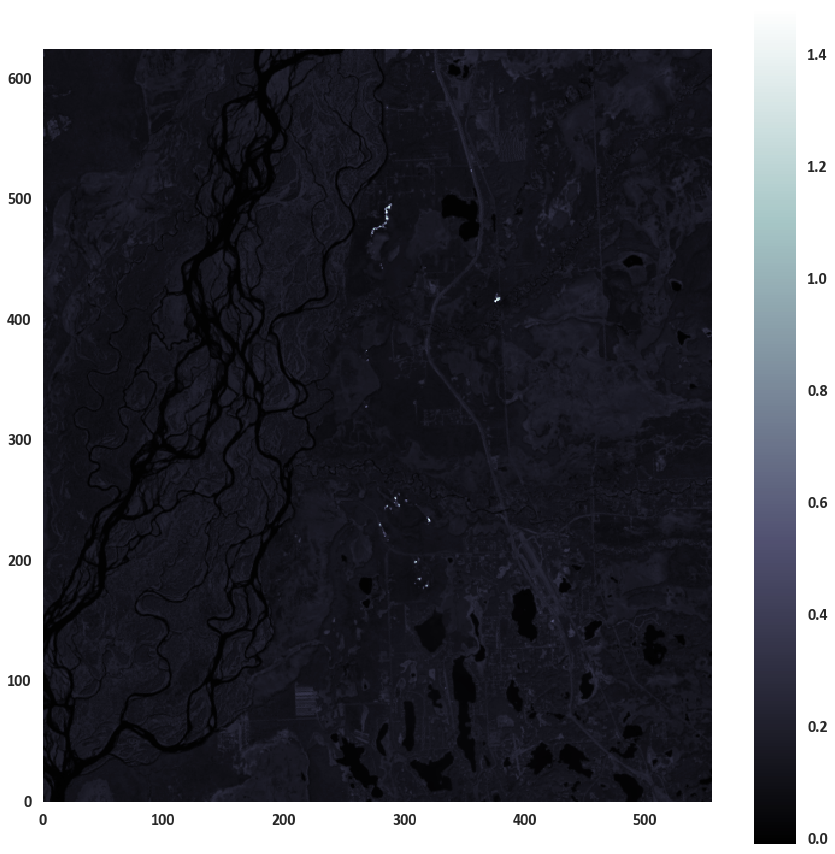

In [18]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(rho6))
cbar = fig1.colorbar(dataplot)

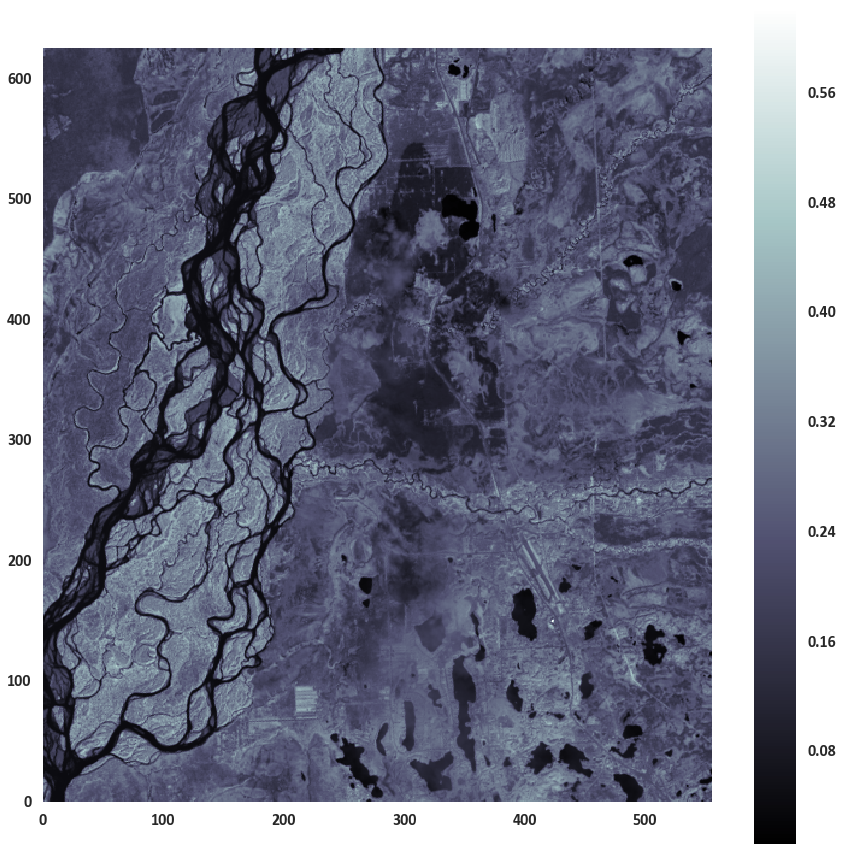

In [19]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(rho5))
cbar = fig1.colorbar(dataplot)

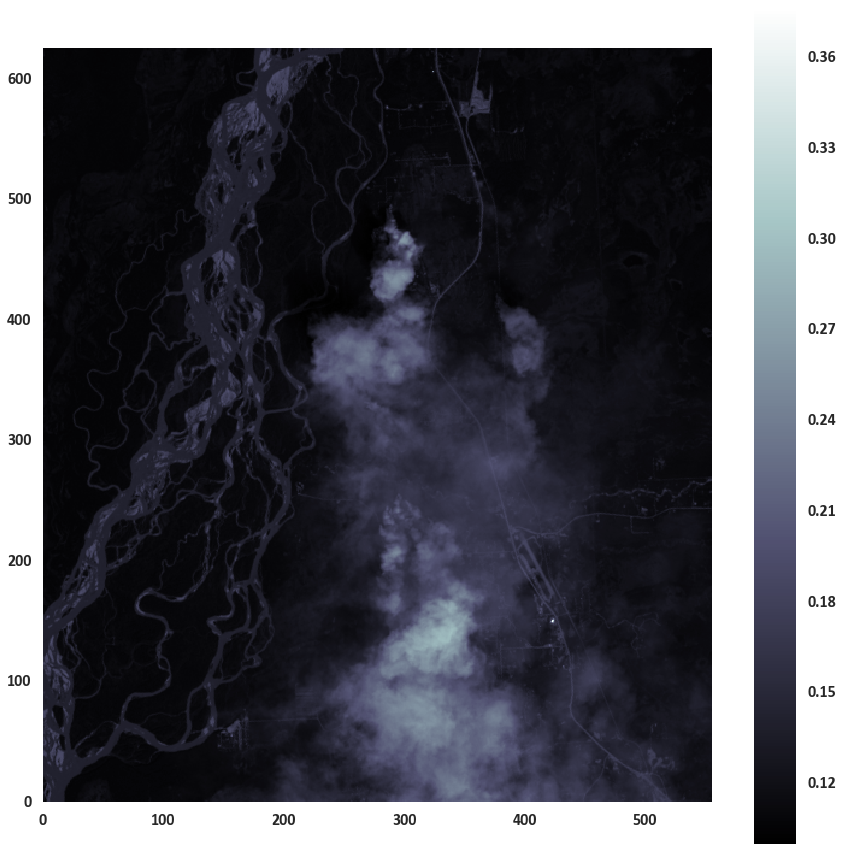

In [20]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(rho1))
cbar = fig1.colorbar(dataplot)

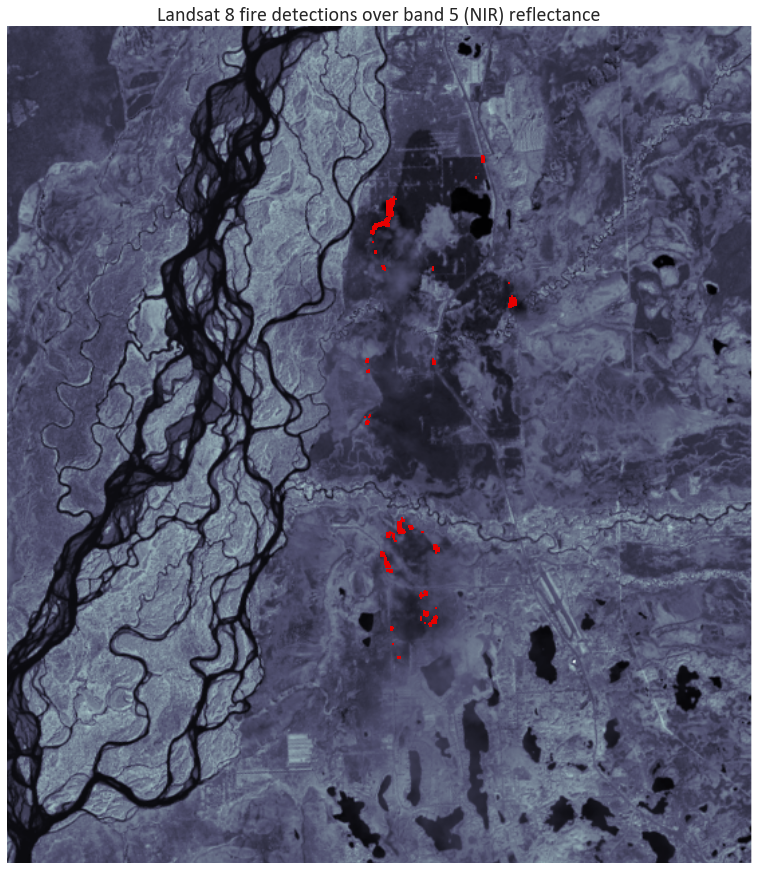

In [21]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.set_title("Landsat 8 fire detections over band 5 (NIR) reflectance")
dataplot = ax1.imshow(np.flipud(rho5))
maskplot1 = ax1.pcolormesh(np.flipud(allfire_masked), cmap=cmap1, vmin=0, vmax=1)

In [22]:
outfn = 'sockeye_landsatB5_firemask.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=200, bb_inches='tight')

In [23]:
landsat.meta['PRODUCT_METADATA']['DATE_ACQUIRED'], landsat.meta['PRODUCT_METADATA']['SCENE_CENTER_TIME']

(datetime.date(2015, 6, 15), datetime.time(21, 19, 17, 235388))

In [24]:
crs = from_string(landsat.band7.proj4)
samplerecords = newviirspolydf[
    (newviirspolydf['DATE'] == '2015-06-15') & 
    (newviirspolydf['GMT'] == '2128')]
firepolygons_h = samplerecords[(samplerecords['Type'] != 'L')]['geometry'].to_crs(crs)
firepolygons_l = samplerecords[(samplerecords['Type'] == 'L')]['geometry'].to_crs(crs)

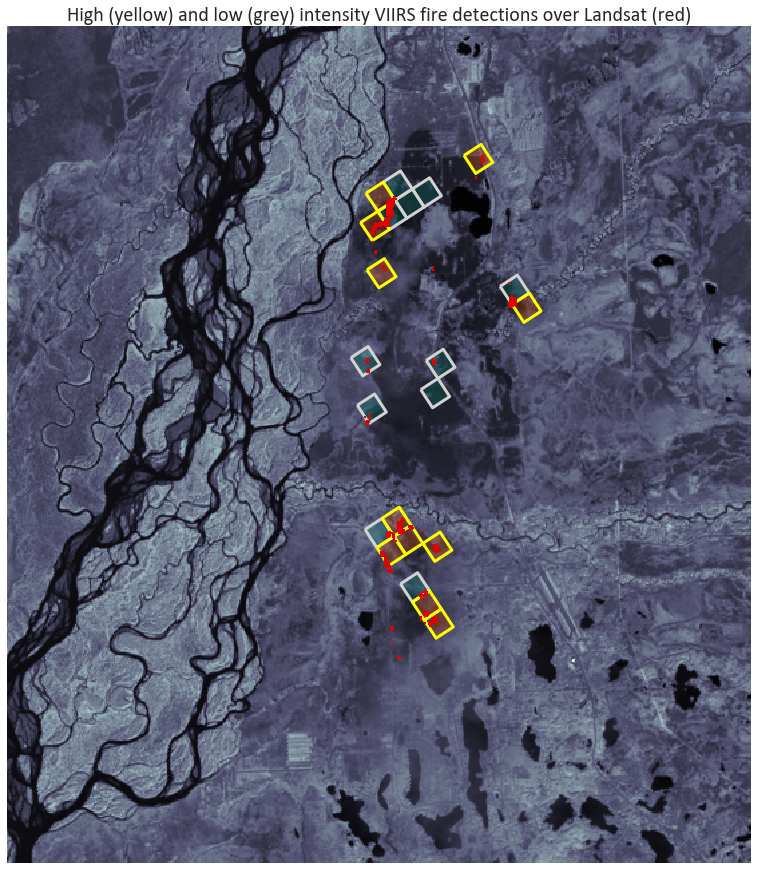

In [25]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], Y[-1, 0]))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat (red)")
dataplot = ax1.pcolormesh(X, Y, rho5)
patches = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=3) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches, match_original=True))
patches = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=3) for poly in firepolygons_h]
ax1.add_collection(PatchCollection(patches, match_original=True))
maskplot1 = ax1.pcolormesh(X, Y, allfire_masked, cmap=cmap1, vmin=0, vmax=1)

In [17]:
outfn = 'sockeye_landsat_firemask_footprints.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=200, bb_inches='tight')

In [26]:
rgb753scene = raster.GeoTIFF(os.path.join(landsatpath, lsscene, 'LC80700172015166LGN00_fc753_8bit_clip.tif'))
rgb753 = np.rollaxis(rgb753scene.data, 0, 3)

In [27]:
rgb753.shape

(626, 556, 4)

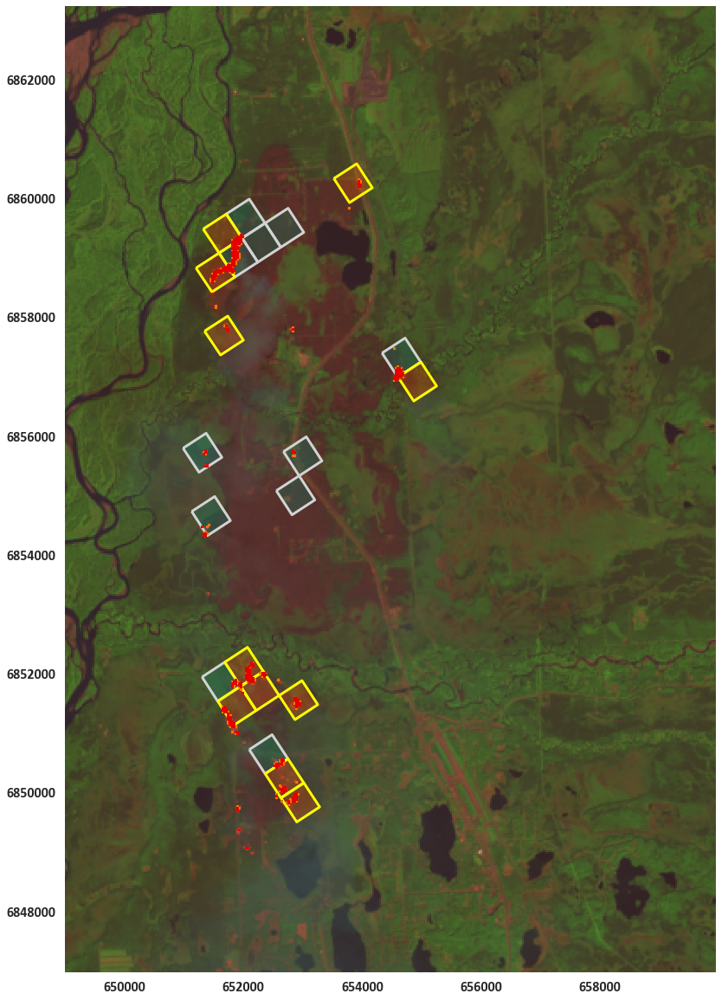

In [28]:
fig1 = plt.figure(1, figsize=(25, 20))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], Y[-1, 0]))
ax1.set_xlim((649000, X[0, -1]))
ax1.set_ylim((Y[0][0], 6847000))
ax1.invert_yaxis()
#ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat (red)")
dataplot = ax1.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
patches = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=3) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches, match_original=True))
patches = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=3) for poly in firepolygons_h]
ax1.add_collection(PatchCollection(patches, match_original=True))
maskplot1 = ax1.pcolormesh(X, Y, allfire_masked, cmap=cmap3, vmin=0, vmax=1)
maskplot2 = ax1.pcolormesh(X, Y, highfire_masked, cmap=cmap1, vmin=0, vmax=1)

In [29]:
print(ax1.get_xlim())
print(ax1.get_ylim())

(649000.0, 659955.0)
(6847000.0, 6863265.0)


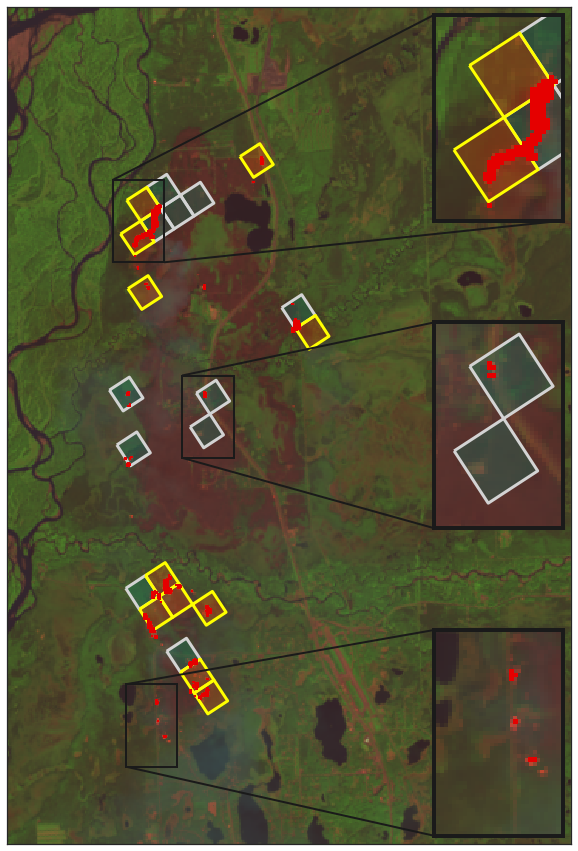

In [31]:
sns.set_style('white')

fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], Y[-1, 0]))
ax1.set_xlim((649000, X[0, -1]))
ax1.set_ylim((Y[0][0], 6847000))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
#ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat (red)")
dataplot = ax1.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
patches1 = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=3) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches1, match_original=True))
patches2 = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=3) for poly in firepolygons_h]
ax1.add_collection(PatchCollection(patches2, match_original=True))
maskplot1 = ax1.pcolormesh(X, Y, allfire_masked, cmap=cmap1, vmin=0, vmax=1)

x1, x2, y1, y2 = 652400, 653400, 6854500, 6856100
axins1 = zoomed_inset_axes(ax1, 2.5, loc=5)
axins1.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
axins1.add_collection(PatchCollection(patches1, match_original=True))
axins1.add_collection(PatchCollection(patches2, match_original=True))
axins1.pcolormesh(X, Y, allfire_masked, cmap=cmap1, vmin=0, vmax=1)
axins1.set_xlim((x1, x2))
axins1.set_ylim((y1, y2))
axins1.set_xticklabels([])
axins1.set_yticklabels([])
mark_inset(ax1, axins1, loc1=2, loc2=3, fc='none', ec='0.1', lw=2)

x1, x2, y1, y2 = 651300, 652300, 6848500, 6850100
axins2 = zoomed_inset_axes(ax1, 2.5, loc=4)
axins2.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
axins2.add_collection(PatchCollection(patches1, match_original=True))
axins2.add_collection(PatchCollection(patches2, match_original=True))
axins2.pcolormesh(X, Y, allfire_masked, cmap=cmap1, vmin=0, vmax=1)
axins2.set_xlim((x1, x2))
axins2.set_ylim((y1, y2))
axins2.set_xticklabels([])
axins2.set_yticklabels([])
mark_inset(ax1, axins2, loc1=2, loc2=3, fc='none', ec='0.1', lw=2)

x1, x2, y1, y2 = 651050, 652050, 6858300, 6859900
axins3 = zoomed_inset_axes(ax1, 2.5, loc=1)
axins3.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
axins3.add_collection(PatchCollection(patches1, match_original=True))
axins3.add_collection(PatchCollection(patches2, match_original=True))
axins3.pcolormesh(X, Y, allfire_masked, cmap=cmap1, vmin=0, vmax=1)
axins3.set_xlim((x1, x2))
axins3.set_ylim((y1, y2))
axins3.set_xticklabels([])
axins3.set_yticklabels([])
mark_inset(ax1, axins3, loc1=2, loc2=4, fc='none', ec='0.1', lw=2)

for axis in ['top', 'bottom', 'left', 'right']:
    for ax in axins1, axins2, axins3:
        ax.spines[axis].set_color('0.1')
        ax.spines[axis].set_linewidth(4)


In [269]:
outfn = 'sockeye_landsat_firemask_footprints01.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=400, bb_inches='tight')

## Statistics

In [32]:
sns.set_style('darkgrid')

In [33]:
samplerecords.to_crs(crs).head()

,AscNode,Bands,DATE,GMT,LAT,LON,Platform,Sensor,TB4,TB5,Type,ZenithAng,geometry
82,Y,I-Bands,2015-06-15,2128,61.751038,-150.102600,NPP,VIIRS,335.128174,298.115112,H,38.803452,"POLYGON ((652632.7666154368 6849930.047025097,..."
83,Y,I-Bands,2015-06-15,2128,61.754780,-150.107315,NPP,VIIRS,349.895752,301.983154,H,38.807564,"POLYGON ((652365.8389114466 6850336.434075646,..."
84,Y,I-Bands,2015-06-15,2128,61.766495,-150.101746,NPP,VIIRS,355.013184,300.098267,H,38.818520,"POLYGON ((652602.048943511 6851653.39595685, 6..."
85,Y,I-Bands,2015-06-15,2128,61.768131,-150.113922,NPP,VIIRS,346.799561,302.516663,H,38.821274,"POLYGON ((651952.1488573964 6851808.12669481, ..."
86,Y,I-Bands,2015-06-15,2128,61.766029,-150.121414,NPP,VIIRS,341.631165,300.126343,H,38.819920,"POLYGON ((651569.3506059131 6851557.804342125,..."


In [34]:
firecond1idx = (ymax - np.where(allfire)[0], np.where(allfire)[1])
firecond1idx

(array([529, 528, 528, 527, 527, 526, 526, 525, 525, 513, 498, 497, 497,
        497, 497, 496, 496, 496, 496, 495, 495, 495, 495, 495, 495, 494,
        494, 494, 494, 494, 494, 493, 493, 493, 493, 493, 493, 492, 492,
        492, 492, 492, 491, 491, 491, 491, 490, 490, 490, 490, 489, 489,
        489, 489, 488, 488, 488, 488, 487, 487, 487, 487, 487, 486, 486,
        486, 486, 486, 485, 485, 485, 485, 485, 484, 484, 484, 483, 483,
        483, 482, 482, 482, 482, 481, 481, 481, 481, 480, 480, 480, 480,
        480, 479, 479, 479, 479, 479, 479, 479, 478, 478, 478, 478, 478,
        478, 478, 478, 478, 478, 478, 477, 477, 477, 477, 477, 477, 477,
        477, 477, 476, 476, 476, 476, 475, 475, 475, 474, 474, 473, 473,
        473, 472, 472, 472, 471, 465, 458, 457, 447, 447, 446, 445, 445,
        445, 444, 444, 434, 424, 423, 423, 423, 423, 422, 422, 422, 422,
        421, 421, 421, 421, 421, 420, 420, 420, 420, 420, 419, 419, 419,
        419, 419, 418, 418, 418, 418, 418, 418, 417

In [36]:
sum(sum(allfire))

390

In [37]:
firepoints_h = [Point(lon, lat) 
    for lon, lat in zip(landsat.band7.Lon_pxcenter[firecond1idx], landsat.band7.Lat_pxcenter[firecond1idx])]

In [38]:
samplerecords['pointcount'] = 0

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [39]:
for idx, record in samplerecords.iterrows():
    poly = record['geometry']
    for pt in firepoints_h:
        if pt.within(poly):
            samplerecords.loc[idx, 'pointcount'] += 1

/usr/local/lib/python2.7/site-packages/pandas/core/indexing.py:426: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [40]:
samplerecords.groupby('Type').describe()

LAT         LON         TB4         TB5  ZenithAng  \
Type                                                                   
H    count  11.000000   11.000000   11.000000   11.000000  11.000000   
     mean   61.793388 -150.105768  344.568071  300.853560  38.845261   
     std     0.036143    0.020399    8.471797    2.514393   0.035084   
     min    61.751038 -150.122116  332.352295  297.609680  38.803452   
     25%    61.766262 -150.119774  338.379669  299.106689  38.819220   
     50%    61.771881 -150.113922  342.657532  300.512451  38.825390   
     75%    61.826797 -150.102173  352.180267  302.249908  38.879450   
     max    61.844131 -150.059250  355.449951  305.047363  38.892292   
L    count  11.000000   11.000000   11.000000   11.000000  11.000000   
     mean   61.808421 -150.107943  327.166457  303.650080  38.860198   
     std     0.027625    0.018421    5.183862    5.329771   0.026620   
     min    61.758530 -150.128815  320.435852  297.988770  38.811684   
     25%    61.796137 -150.120331  323.863251  299.227783  38.848665   
     50%    61.804462 -150.111740  326.659760  301.934021  38.858276   
     75%    61.834726 -150.099609  328.505096  307.111252  38.886246   
     max    61.839516 -150.064011  338.098206  314.724457  38.891026   

            pointcount  
Type                    
H    count   11.000000  
     mean    18.727273  
     std     12.498727  
     min      4.000000  
     25%      9.000000  
     50%     17.000000  
     75%     24.000000  
     max     42.000000  
L    count   11.000000  
     mean    12.727273  
     std     19.053036  
     min      0.000000  
     25%      1.500000  
     50%      6.000000  
     75%     13.500000  
     max     65.000000

(-2, 67)

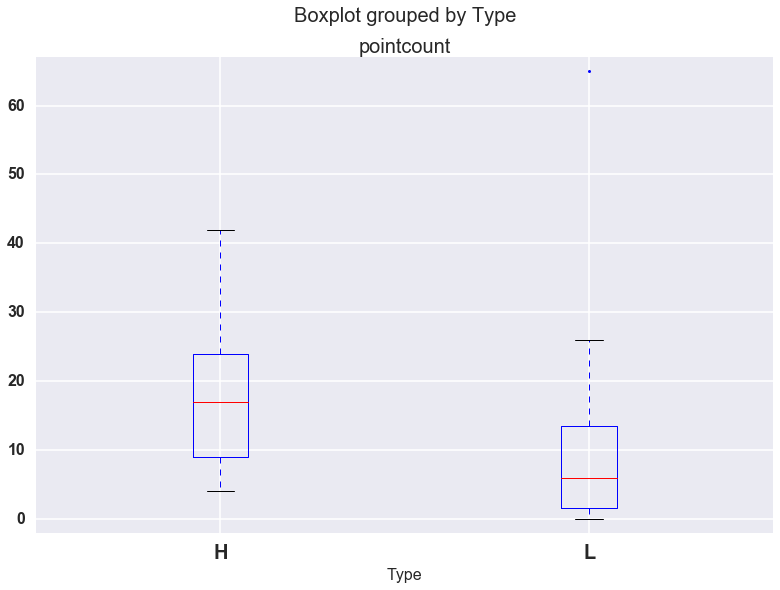

In [41]:
samplerecords[['pointcount', 'Type']].boxplot(column='pointcount', by='Type', sym='k.')
ax = plt.gca()
ax.set_ylim(-2, 67)


In [447]:
myfig = plt.gcf()
outfn = 'sockeye_landsat_firematch_boxplot.png'
myfig.savefig(os.path.join(productdir, outfn), dpi=200, bb_inches='tight')

(-2, 67)

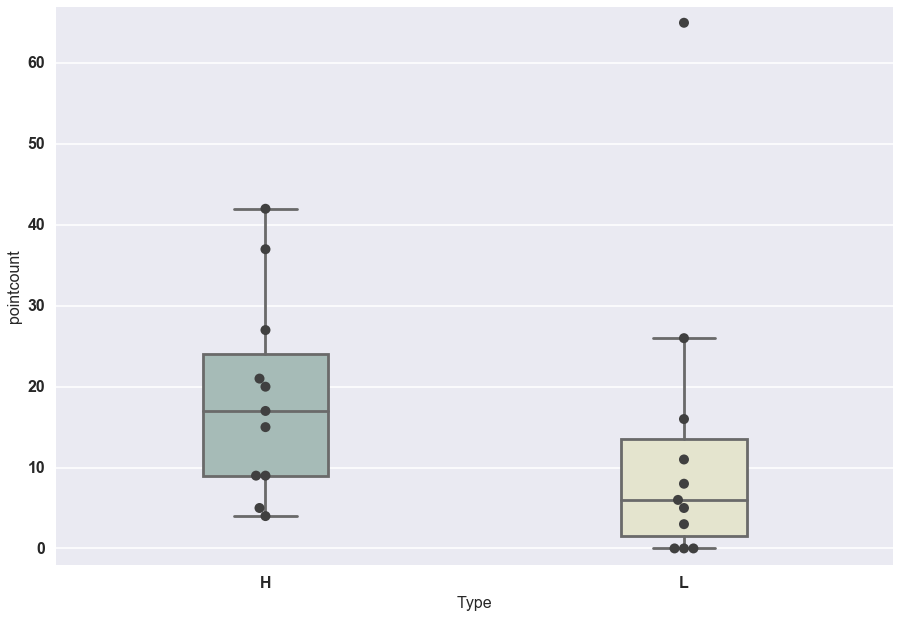

In [42]:
fig2 = plt.figure(1, figsize=(15, 10))
ax2 = fig2.add_subplot(111)
sns.boxplot(x='Type', y='pointcount', data=samplerecords,
    palette="Set3", saturation=0.3, width=.3, ax=ax2)
sns.swarmplot(
    x='Type', y='pointcount', data=samplerecords, color=".25", size=10, ax=ax2)
ax2.set_ylim(-2, 67)

In [449]:
outfn = 'sockeye_landsat_firematch_boxplot.png'
fig2.savefig(os.path.join(productdir, outfn), dpi=200, bb_inches='tight')

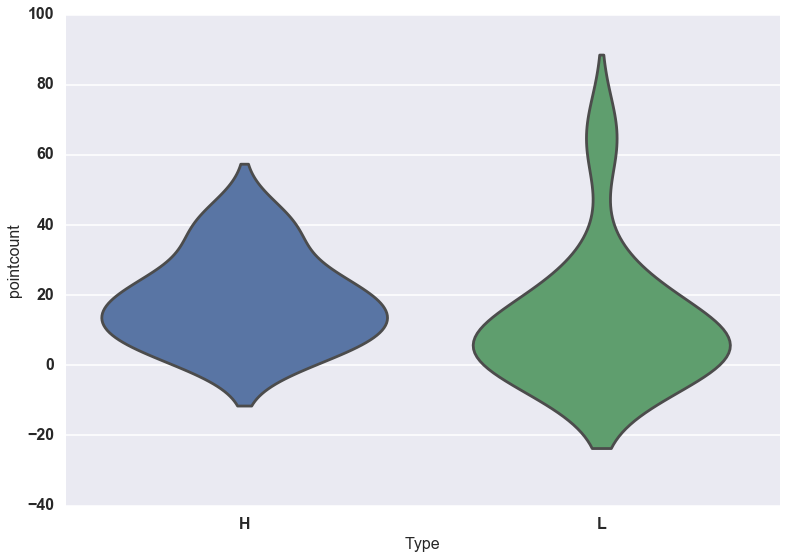

In [43]:
ax = sns.violinplot(x='Type', y='pointcount', data=samplerecords, inner=None)

### Look into NBR

In [44]:
NBR = landsat.NBR

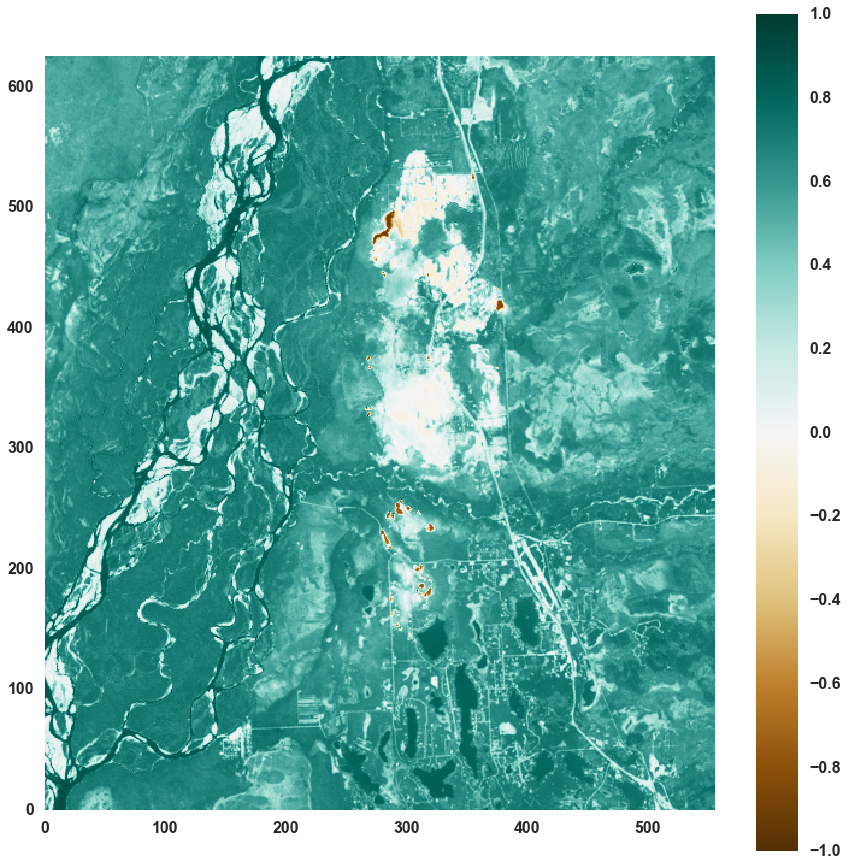

In [45]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(NBR), cmap='BrBG', vmin=-1., vmax=1.)
cbar = fig1.colorbar(dataplot)

In [46]:
scene_before = 'LC80700172015150LGN00'
scene_after = 'LC80700172015214LGN00'
landsat_before = raster.Landsatscene(os.path.join(landsatpath, scene_before))
landsat_after = raster.Landsatscene(os.path.join(landsatpath, scene_after))
landsat_before.infix = '_clip'
landsat_after.infix = '_clip'

In [47]:
NBR_before = landsat_before.NBR
NBR_after = landsat_after.NBR

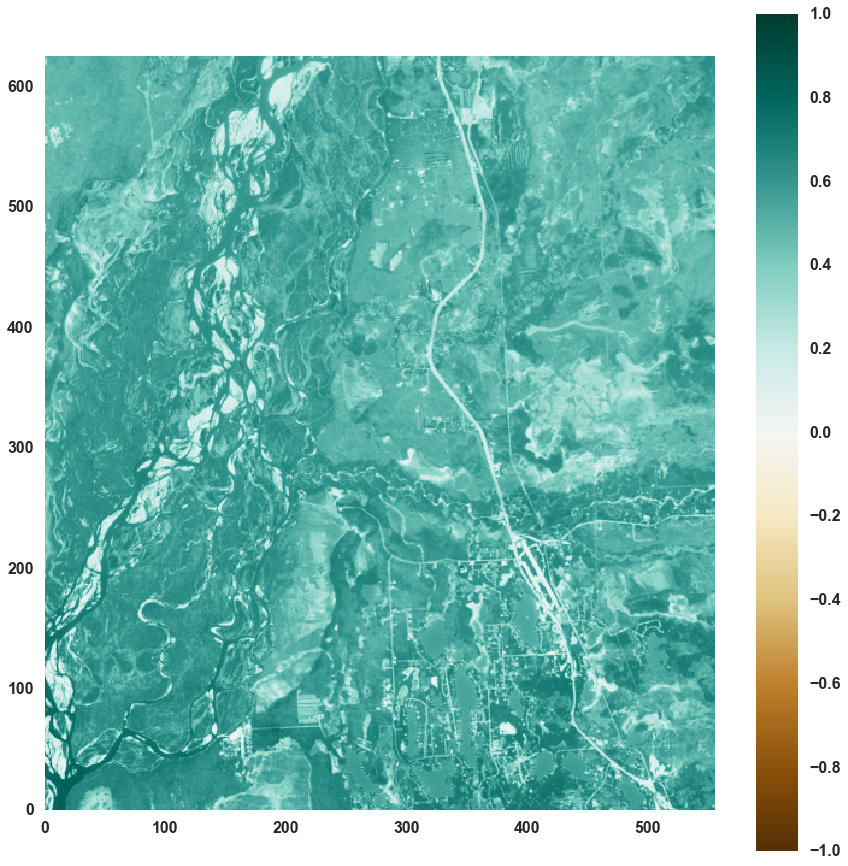

In [48]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(NBR_before), cmap='BrBG', vmin=-1., vmax=1.)
cbar = fig1.colorbar(dataplot)

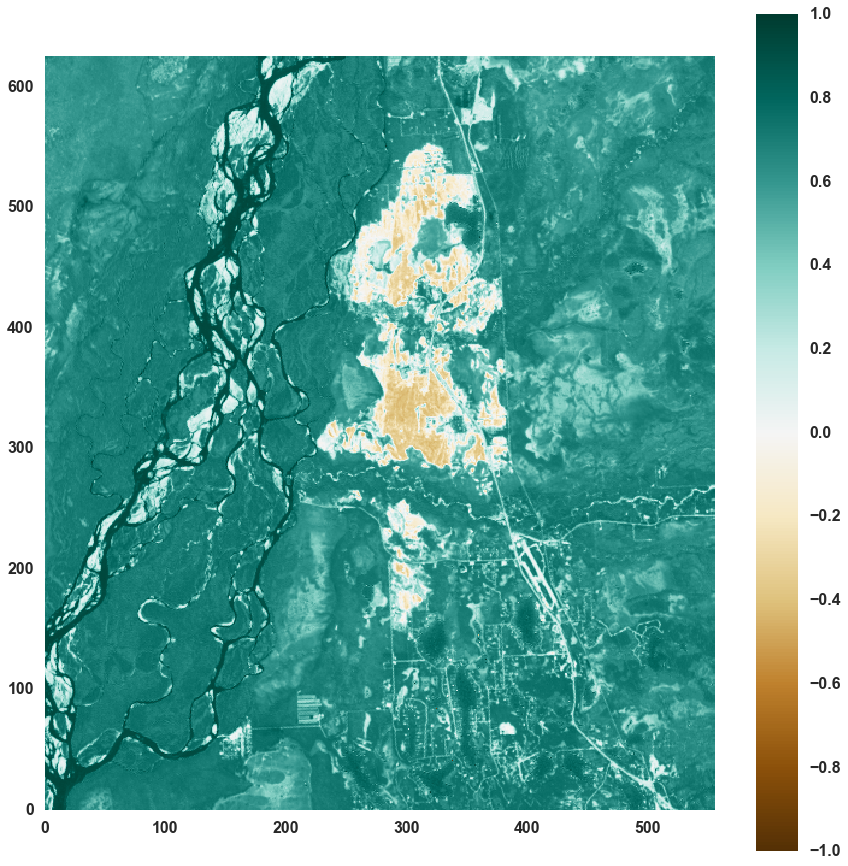

In [49]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(NBR_after), cmap='BrBG', vmin=-1., vmax=1.)
cbar = fig1.colorbar(dataplot)

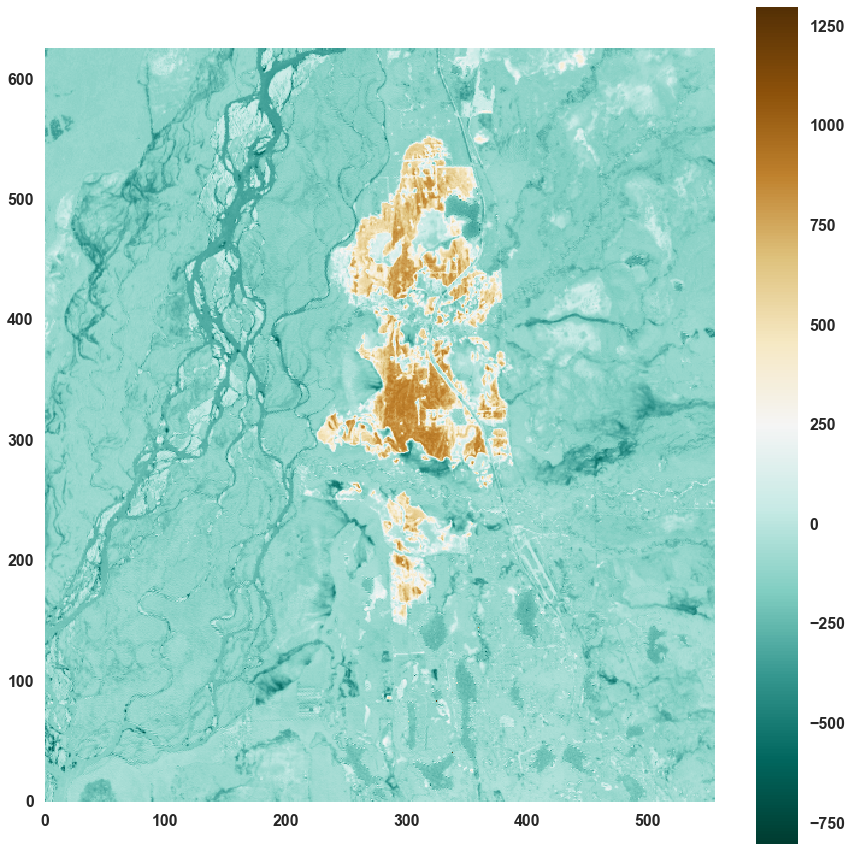

In [50]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(NBR_before - NBR_after)*1000, cmap='BrBG_r', vmin=-800., vmax=1300.)
cbar = fig1.colorbar(dataplot)

In [51]:
crs = from_string(landsat_after.band7.proj4)
firepolygons = newviirspolydf['geometry'].to_crs(crs)

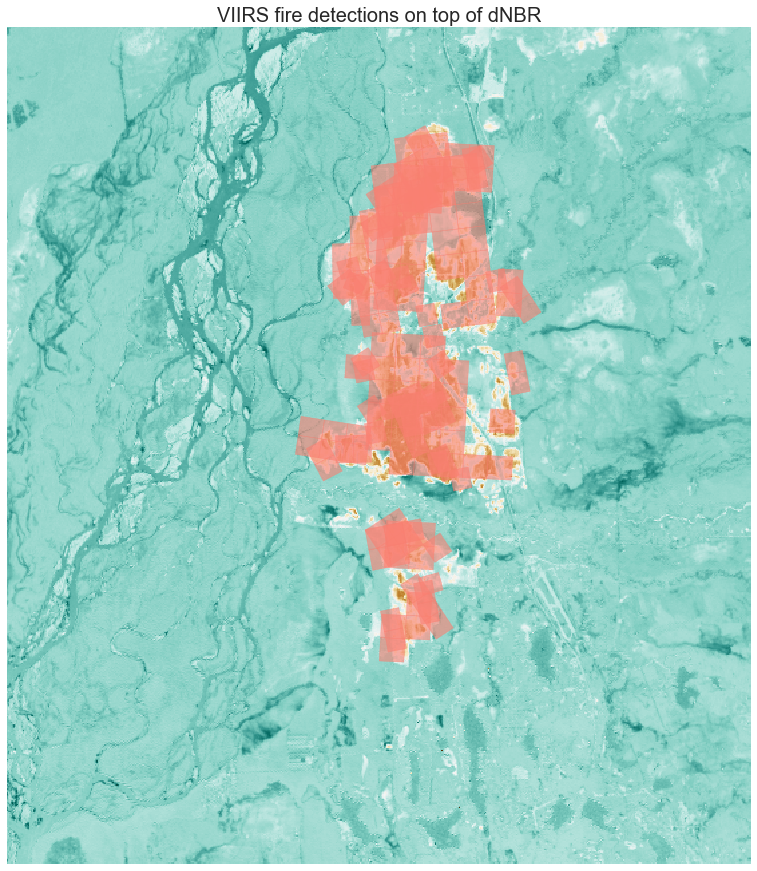

In [52]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat_after.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], Y[-1, 0]))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("VIIRS fire detections on top of dNBR")
dataplot = ax1.pcolormesh(X, Y, (NBR_before - NBR_after)*1000, cmap='BrBG_r', vmin=-800., vmax=1300.)
patches = [PolygonPatch(poly, color='salmon', alpha=0.6) for poly in firepolygons]
ax1.add_collection(PatchCollection(patches, match_original=True))

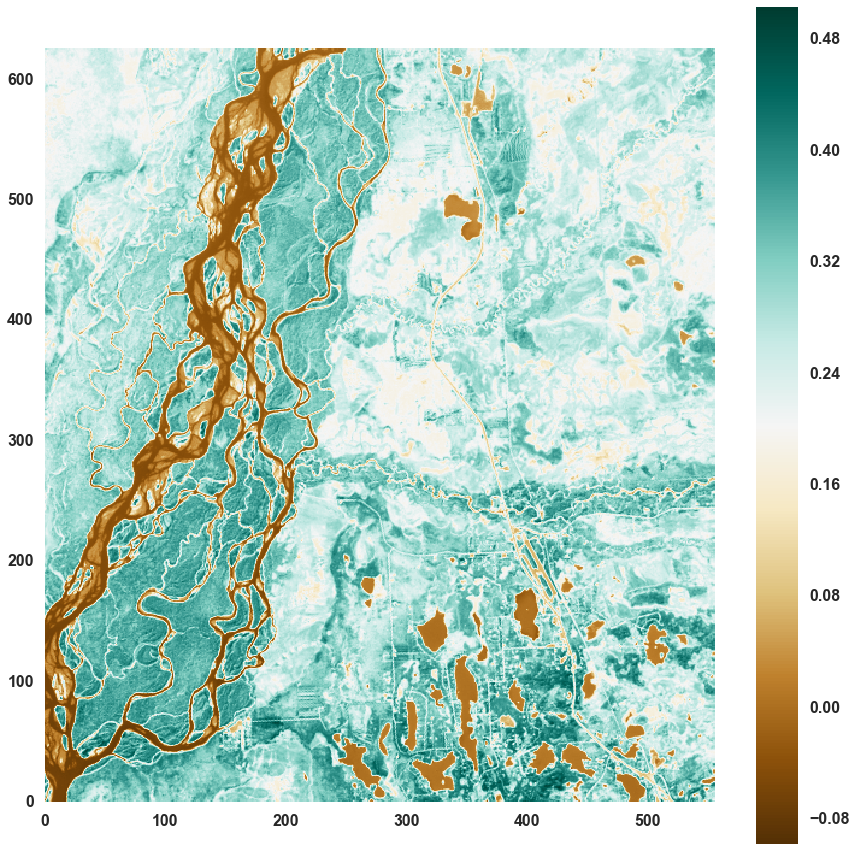

In [53]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(landsat_before.NDVI), cmap='BrBG')
cbar = fig1.colorbar(dataplot)